In [13]:
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from pathlib import Path

import bind
from bind.inference.lightcone_transforms import LightconeTransforms
from bind.inference.lensplane import comoving_distance_from_a, build_lightcone_geometry

plt.rcParams.update({"figure.dpi": 120, "font.size": 11})

OUTPUT_ROOT    = Path("/mnt/home/mlee1/ceph/bind_lightcone_tng")
TRANSFORMS_FILE = OUTPUT_ROOT / "lightcone_transforms.json"
SNAPSHOTS      = [96, 90, 85, 80, 76, 71, 67, 63, 59, 56, 52, 49, 46, 43, 41, 38, 35, 33, 31, 29]
SNAP_DIRS      = [OUTPUT_ROOT / f"snap_{s:03d}" for s in SNAPSHOTS]
Omega_m        = 0.3089   # IllustrisTNG fiducial

## 1. Lightcone geometry

20/20 manifests found


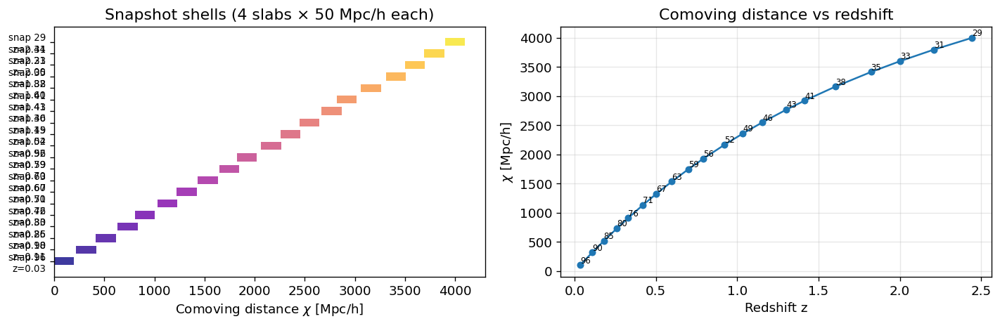

Total comoving depth: 4001 Mpc/h  (z_max=2.44)


In [14]:
# Read manifests for available snapshots
manifests = {}
for s, d in zip(SNAPSHOTS, SNAP_DIRS):
    mfile = d / "stage1" / "stage1_manifest.json"
    if mfile.exists():
        manifests[s] = json.loads(mfile.read_text())

print(f"{len(manifests)}/{len(SNAPSHOTS)} manifests found")

a_snaps = [manifests[s]["scale_factor"] for s in SNAPSHOTS if s in manifests]
z_snaps = [1/a - 1 for a in a_snaps]
chi_snaps = [comoving_distance_from_a(a, Omega_m) for a in a_snaps]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
box = 205.0
for i, (z, chi, s) in enumerate(zip(z_snaps, chi_snaps, [s for s in SNAPSHOTS if s in manifests])):
    m = manifests[s]
    n_slabs = m["n_slabs"]
    slab_depth = m["slab_depth"]
    for sl in range(n_slabs):
        chi0 = chi - box/2 + sl * slab_depth
        ax.barh(i, slab_depth, left=chi0, height=0.7,
                color=plt.cm.plasma(i / len(a_snaps)), alpha=0.8)
ax.set_xlabel(r"Comoving distance $\chi$ [Mpc/h]")
ax.set_yticks(range(len(a_snaps)))
ax.set_yticklabels([f"snap {s}\nz={z:.2f}" for s, z in zip(
    [s for s in SNAPSHOTS if s in manifests], z_snaps)], fontsize=8)
ax.set_title("Snapshot shells (4 slabs × 50 Mpc/h each)")

ax = axes[1]
ax.plot(z_snaps, chi_snaps, "o-", ms=5)
for s, z, chi in zip([s for s in SNAPSHOTS if s in manifests], z_snaps, chi_snaps):
    ax.annotate(f"{s}", (z, chi), fontsize=7, ha="left", va="bottom")
ax.set_xlabel("Redshift z")
ax.set_ylabel(r"$\chi$ [Mpc/h]")
ax.set_title("Comoving distance vs redshift")
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
print(f"Total comoving depth: {chi_snaps[-1]:.0f} Mpc/h  (z_max={z_snaps[-1]:.2f})")

## 2. Lightcone transforms

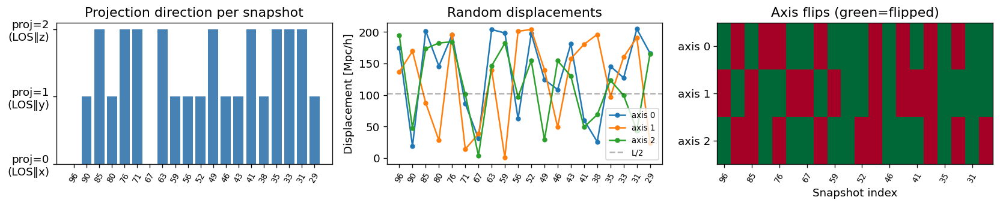

In [15]:
if TRANSFORMS_FILE.exists():
    transforms = LightconeTransforms.load(TRANSFORMS_FILE)
    axis_labels = {0: "x (LOS)", 1: "y (LOS)", 2: "z (LOS)"}

    fig, axes = plt.subplots(1, 3, figsize=(14, 3))

    ax = axes[0]
    ax.bar(range(len(SNAPSHOTS)), transforms.proj_dirs, color="steelblue")
    ax.set_xticks(range(len(SNAPSHOTS)))
    ax.set_xticklabels(SNAPSHOTS, rotation=60, fontsize=8)
    ax.set_yticks([0, 1, 2])
    ax.set_yticklabels(["proj=0\n(LOS‖x)", "proj=1\n(LOS‖y)", "proj=2\n(LOS‖z)"])
    ax.set_title("Projection direction per snapshot")

    ax = axes[1]
    for j, color in enumerate(["C0", "C1", "C2"]):
        ax.plot(range(len(SNAPSHOTS)), transforms.disp[:, j],
                "o-", color=color, ms=4, label=f"axis {j}")
    ax.axhline(205/2, ls="--", color="k", alpha=0.3, label="L/2")
    ax.set_xticks(range(len(SNAPSHOTS)))
    ax.set_xticklabels(SNAPSHOTS, rotation=60, fontsize=8)
    ax.set_ylabel("Displacement [Mpc/h]")
    ax.set_title("Random displacements")
    ax.legend(fontsize=8)

    ax = axes[2]
    flip_int = transforms.flip.astype(int)
    im = ax.imshow(flip_int.T, aspect="auto", cmap="RdYlGn", vmin=0, vmax=1)
    ax.set_xlabel("Snapshot index")
    ax.set_yticks([0, 1, 2])
    ax.set_yticklabels(["axis 0", "axis 1", "axis 2"])
    ax.set_xticks(range(0, len(SNAPSHOTS), 2))
    ax.set_xticklabels(SNAPSHOTS[::2], rotation=60, fontsize=8)
    ax.set_title("Axis flips (green=flipped)")

    plt.tight_layout()
    plt.show()
else:
    print("lightcone_transforms.json not yet written")

## 3. Halo counts and mass function

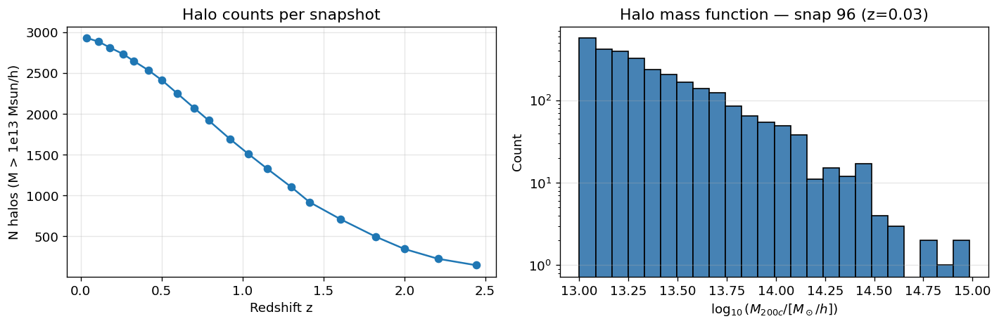

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Halo counts per snapshot
ax = axes[0]
snaps_done = [s for s in SNAPSHOTS if s in manifests]
n_halos = [manifests[s]["n_halos"] for s in snaps_done]
z_done  = [1/manifests[s]["scale_factor"] - 1 for s in snaps_done]
ax.plot(z_done, n_halos, "o-")
ax.set_xlabel("Redshift z")
ax.set_ylabel("N halos (M > 1e13 Msun/h)")
ax.set_title("Halo counts per snapshot")
ax.grid(True, alpha=0.3)

# Halo mass function from z=0 snapshot
ax = axes[1]
s0 = SNAPSHOTS[0]
if s0 in manifests:
    d0 = np.load(SNAP_DIRS[0] / "stage1" / "stage1_slab00.npz")
    masses = []
    for slab_f in sorted((SNAP_DIRS[0] / "stage1").glob("stage1_slab*.npz")):
        dd = np.load(slab_f)
        masses.append(dd["halo_masses"])
    masses = np.concatenate(masses)
    log_m = np.log10(masses)
    bins = np.linspace(log_m.min(), log_m.max(), 25)
    ax.hist(log_m, bins=bins, log=True, color="steelblue", edgecolor="k", lw=0.5)
    ax.set_xlabel(r"$\log_{10}(M_{200c} / [M_\odot/h])$")
    ax.set_ylabel("Count")
    ax.set_title(f"Halo mass function — snap {s0} (z={z_done[0]:.2f})")
    ax.grid(True, alpha=0.3, axis="y")

plt.tight_layout()
plt.show()

## 5. BIND composite maps: DM_hydro, Gas, Stars

20/20 snapshots have stage-2 composites


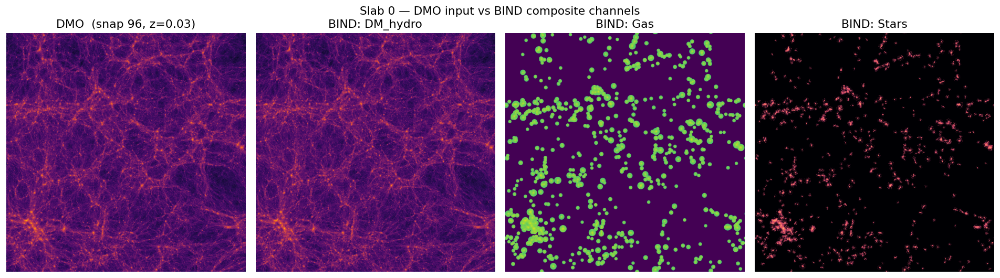

Halo coverage: 15.7%


In [17]:
channel_names = ["DM_hydro", "Gas", "Stars"]
cmaps = ["inferno", "viridis", "magma"]

snaps_with_composites = [
    s for s, d in zip(SNAPSHOTS, SNAP_DIRS)
    if (d / "composite_slab00.npz").exists()
]
print(f"{len(snaps_with_composites)}/{len(SNAPSHOTS)} snapshots have stage-2 composites")

if snaps_with_composites:
    # Show the 3 channels side-by-side for the first available snapshot
    s = snaps_with_composites[0]
    snap_dir = SNAP_DIRS[SNAPSHOTS.index(s)]
    dc = np.load(snap_dir / "composite_slab00.npz")
    composite = dc["composite"]  # (3, 4198, 4198)
    dmo = dc["dmo"]
    z = 1/manifests[s]["scale_factor"] - 1 if s in manifests else "?"

    fig, axes = plt.subplots(1, 4, figsize=(16, 4.5))
    axes[0].imshow(np.log10(dmo + 1), cmap="inferno", origin="lower")
    axes[0].set_title(f"DMO  (snap {s}, z={z:.2f})")
    axes[0].axis("off")

    for j, (name, cmap) in enumerate(zip(channel_names, cmaps)):
        ch = composite[j]
        axes[j+1].imshow(np.log10(ch + 1), cmap=cmap, origin="lower")
        axes[j+1].set_title(f"BIND: {name}")
        axes[j+1].axis("off")

    plt.suptitle("Slab 0 — DMO input vs BIND composite channels", fontsize=13)
    plt.tight_layout()
    plt.show()

    # Coverage
    alpha = dc["alpha"]
    print(f"Halo coverage: {float(dc['coverage_pct']):.1f}%")
else:
    print("Stage 2 not yet complete — run again once composites appear")

## 6. Thermo channels (compton_y, T, entropy, P_e)

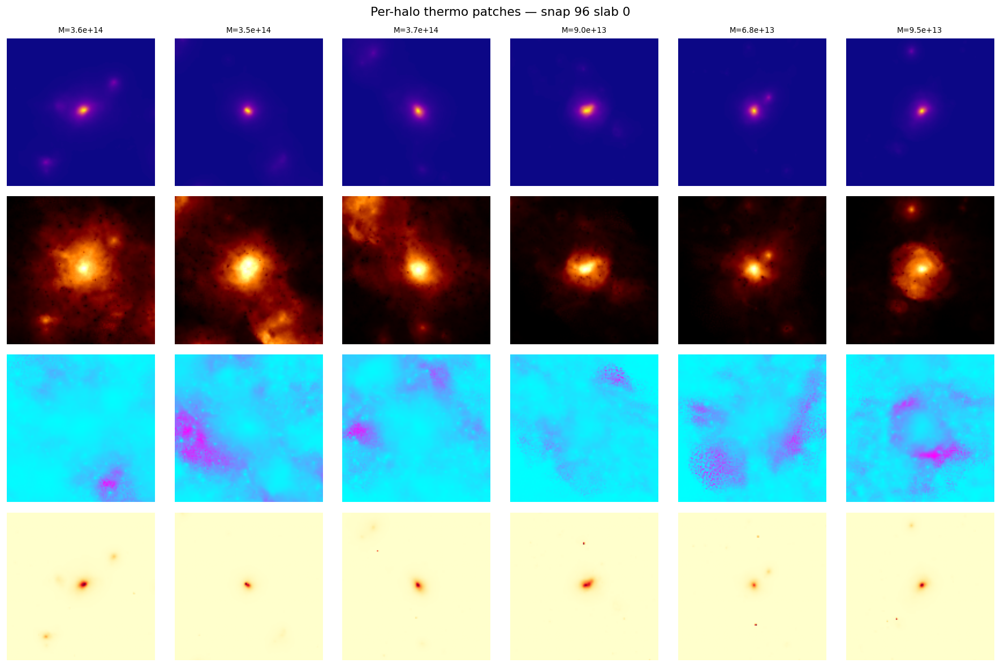

In [18]:
thermo_names = ["Compton-y", "Temperature", "Entropy", "Electron pressure"]
thermo_cmaps = ["plasma", "afmhot", "cool", "YlOrRd"]

if snaps_with_composites:
    s = snaps_with_composites[0]
    snap_dir = SNAP_DIRS[SNAPSHOTS.index(s)]
    dc = np.load(snap_dir / "composite_slab00.npz")

    if "thermo_patches" in dc and dc["thermo_patches"].shape[1] == 4:
        patches = dc["thermo_patches"]  # (N_halos, 4, 128, 128)
        centers = dc["halo_centers"]    # (N_halos, 2)
        npix = 4198#int(dc["npix"])

        # Build a simple stamp mosaic of the 4 thermo channels for 6 halos
        n_show = min(6, len(patches))
        fig, axes = plt.subplots(4, n_show, figsize=(2.5*n_show, 10))
        for row, (name, cmap) in enumerate(zip(thermo_names, thermo_cmaps)):
            for col in range(n_show):
                ax = axes[row, col]
                ax.imshow(patches[col, row], cmap=cmap, origin="lower")
                if row == 0:
                    m = dc["halo_masses"][col]
                    ax.set_title(f"M={m:.1e}", fontsize=8)
                if col == 0:
                    ax.set_ylabel(name, fontsize=9)
                ax.axis("off")
        plt.suptitle(f"Per-halo thermo patches — snap {s} slab 0", fontsize=13)
        plt.tight_layout()
        plt.show()
    else:
        print("No thermo patches in this composite (model may not have thermo)")

## 7. Lightcone strip — 2D assembled view

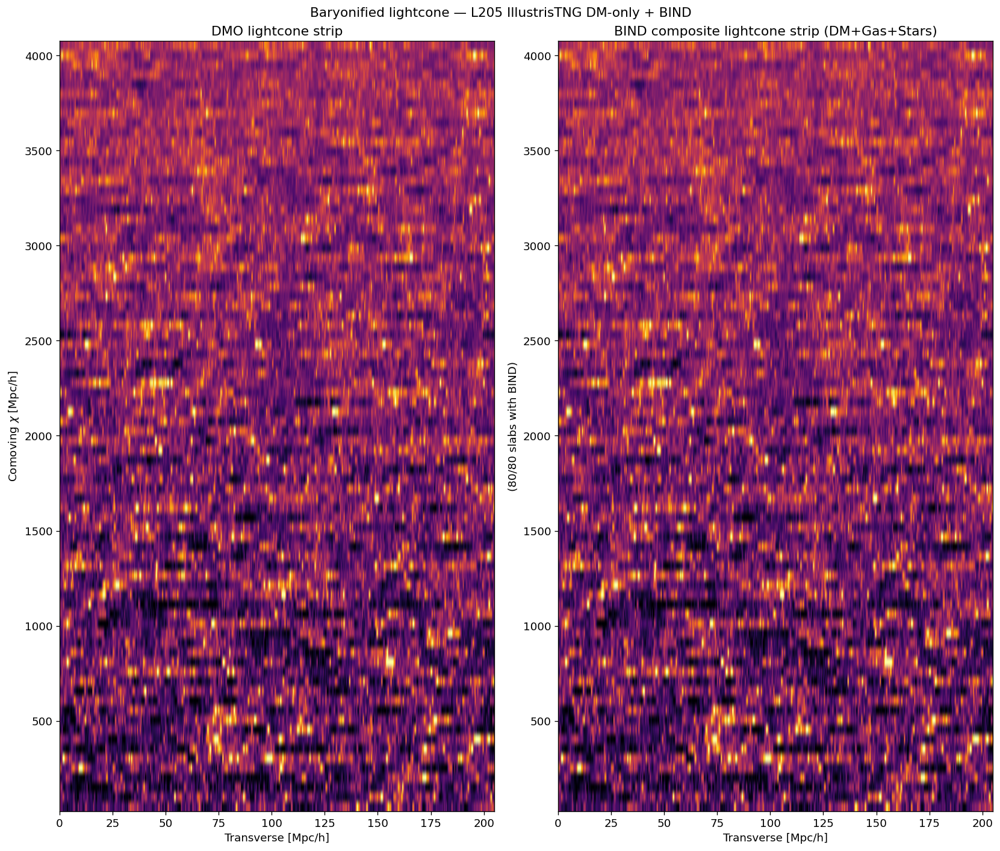

Strip dimensions: (80, 4198) (80 slabs × 4198 pixels)


In [19]:
# Assemble a thin transverse strip from each slab into a 2D lightcone image.
# x-axis = transverse (Mpc/h), y-axis = increasing comoving distance (LOS).
# For each slab we take a central strip of STRIP_PIX rows and collapse to one row.

STRIP_PIX = 20   # rows to average for the strip

strips_dmo  = []
strips_bind = []
strip_chis  = []

for s, snap_dir in zip(SNAPSHOTS, SNAP_DIRS):
    if s not in manifests:
        continue
    m = manifests[s]
    a = m["scale_factor"]
    chi = comoving_distance_from_a(a, Omega_m)
    n_slabs = m["n_slabs"]
    slab_depth = m["slab_depth"]

    for sl in range(n_slabs):
        chi_slab = chi - (n_slabs/2 - sl - 0.5) * slab_depth

        # DMO strip
        f_s1 = snap_dir / "stage1" / f"stage1_slab{sl:02d}.npz"
        if not f_s1.exists():
            continue
        d1 = np.load(f_s1)
        dmo = d1["dmo"]   # (4198, 4198)
        mid = dmo.shape[0] // 2
        strip = np.log10(dmo[mid - STRIP_PIX//2 : mid + STRIP_PIX//2] + 1).mean(axis=0)
        strips_dmo.append(strip)

        # BIND composite strip (total mass)
        f_s2 = snap_dir / f"composite_slab{sl:02d}.npz"
        if f_s2.exists():
            d2 = np.load(f_s2)
            comp_total = d2["composite"].sum(axis=0)  # DM+Gas+Stars
            strip_b = np.log10(comp_total[mid - STRIP_PIX//2 : mid + STRIP_PIX//2] + 1).mean(axis=0)
            strips_bind.append(strip_b)
        else:
            strips_bind.append(None)

        strip_chis.append((chi_slab, s, sl))

if strips_dmo:
    # Sort by comoving distance
    order = np.argsort([c[0] for c in strip_chis])
    img_dmo = np.stack([strips_dmo[i] for i in order])  # (N_slabs_total, Npix)

    has_bind = [strips_bind[i] is not None for i in order]

    ncols = 1 + int(any(has_bind))
    fig, axes = plt.subplots(1, ncols, figsize=(14, 6 if ncols == 1 else 12))
    if ncols == 1:
        axes = [axes]

    chi_vals = [strip_chis[i][0] for i in order]
    box_mpc = float(strips_dmo[0].shape[0]) * 205.0 / 4198.0  # approx 205 Mpc/h
    extent = [0, 205, chi_vals[0], chi_vals[-1]]

    axes[0].imshow(img_dmo, aspect="auto", cmap="inferno", origin="lower",
                   vmin=np.percentile(img_dmo, 1), vmax=np.percentile(img_dmo, 99.5),
                   extent=extent)
    axes[0].set_xlabel("Transverse [Mpc/h]")
    axes[0].set_ylabel(r"Comoving $\chi$ [Mpc/h]")
    axes[0].set_title("DMO lightcone strip")

    if any(has_bind):
        bind_rows = [strips_bind[i] if has_bind[i] else np.zeros_like(strips_dmo[i])
                     for i in order]
        img_bind = np.stack(bind_rows)
        axes[1].imshow(img_bind, aspect="auto", cmap="inferno", origin="lower",
                       vmin=np.percentile(img_dmo, 1), vmax=np.percentile(img_dmo, 99.5),
                       extent=extent)
        axes[1].set_xlabel("Transverse [Mpc/h]")
        axes[1].set_title("BIND composite lightcone strip (DM+Gas+Stars)")
        n_done = sum(has_bind)
        axes[1].set_ylabel(f"({n_done}/{len(order)} slabs with BIND)")

    plt.suptitle("Baryonified lightcone — L205 IllustrisTNG DM-only + BIND", fontsize=13)
    plt.tight_layout()
    plt.show()
    print(f"Strip dimensions: {img_dmo.shape} ({img_dmo.shape[0]} slabs × {img_dmo.shape[1]} pixels)")

## 8. Per-snapshot BIND progress

In [20]:
print(f"{'Snap':>6}  {'z':>6}  {'Stage1':>8}  {'S2 slabs':>10}  {'Coverage':>10}  {'N_halos':>8}")
print("-" * 60)
for s, snap_dir in zip(SNAPSHOTS, SNAP_DIRS):
    s1 = "OK" if s in manifests else "--"
    z = f"{1/manifests[s]['scale_factor']-1:.2f}" if s in manifests else "?"
    n_halos = manifests[s]["n_halos"] if s in manifests else "-"
    n_slabs = manifests[s]["n_slabs"] if s in manifests else 4
    s2_done = sum(1 for sl in range(n_slabs) if (snap_dir / f"composite_slab{sl:02d}.npz").exists())
    cov = "-"
    if s2_done > 0:
        dc = np.load(snap_dir / "composite_slab00.npz")
        cov = f"{float(dc['coverage_pct']):.1f}%"
    print(f"{s:>6}  {z:>6}  {s1:>8}  {s2_done:>3}/{n_slabs:<3}      {cov:>8}  {str(n_halos):>8}")

  Snap       z    Stage1    S2 slabs    Coverage   N_halos
------------------------------------------------------------
    96    0.03        OK    4/4           15.7%      2933
    90    0.11        OK    4/4           18.1%      2886
    85    0.18        OK    4/4           19.3%      2813
    80    0.26        OK    4/4           16.9%      2734
    76    0.33        OK    4/4           19.0%      2647
    71    0.42        OK    4/4           17.9%      2533
    67    0.50        OK    4/4           18.1%      2411


KeyboardInterrupt: 

## 9. Born approximation convergence κ

Sum over all lens planes weighted by the lensing efficiency:
$$\kappa(\theta) = \frac{3\Omega_m}{2}\left(\frac{H_0}{c}\right)^2
\sum_{\rm planes} \frac{\chi_l(\chi_s - \chi_l)}{\chi_s\, a_l}\,\delta_{\rm scaled}(\theta)$$
where $\delta_{\rm scaled} = (\Sigma/\bar{\Sigma} - 1)\times L_{\rm slab}$ [Mpc/h] comes directly from the mass maps.

In [ ]:
from bind.inference.lensplane import mass_map_to_delta_scaled, C_KMS

# ── Settings ──────────────────────────────────────────────────────────────────
Z_SOURCE  = 1.5   # source plane redshift
DS_FACTOR = 8     # downsample 4198 → ~524 px to keep memory reasonable

a_source  = 1.0 / (1.0 + Z_SOURCE)
chi_s     = comoving_distance_from_a(a_source, Omega_m)
prefactor = 1.5 * Omega_m * (100.0 / C_KMS) ** 2   # [1/(Mpc/h)^2]

print(f"Source z={Z_SOURCE}  chi_s={chi_s:.0f} Mpc/h")
print(f"Lensing prefactor = {prefactor:.4e} (Mpc/h)^-2")


def _downsample(arr, ds):
    n = (arr.shape[0] // ds) * ds
    return arr[:n, :n].reshape(n//ds, ds, n//ds, ds).mean(axis=(1, 3))


kappa_dmo  = None
kappa_bind = None
n_planes = 0   # counts planes present in BOTH — keeps comparison fair

for s, snap_dir in zip(SNAPSHOTS, SNAP_DIRS):
    if s not in manifests:
        continue
    m          = manifests[s]
    a_l        = m["scale_factor"]
    chi_snap   = comoving_distance_from_a(a_l, Omega_m)
    if chi_snap >= chi_s:
        continue
    box_size   = float(m["box_size"])
    n_slabs    = int(m["n_slabs"])
    slab_depth = float(m["slab_depth"])

    for sl in range(n_slabs):
        f_s1 = snap_dir / "stage1" / f"stage1_slab{sl:02d}.npz"
        f_s2 = snap_dir / f"composite_slab{sl:02d}.npz"

        # Only include planes where BOTH exist — keeps kappa_dmo and kappa_bind
        # on the same set of planes so their amplitudes are directly comparable.
        if not (f_s1.exists() and f_s2.exists()):
            continue

        chi_l = chi_snap - (n_slabs / 2 - sl - 0.5) * slab_depth
        if chi_l <= 0 or chi_l >= chi_s:
            continue
        weight = prefactor * chi_l * (chi_s - chi_l) / (chi_s * a_l)

        dmo   = np.load(f_s1)["dmo"].astype(np.float64)
        total = np.load(f_s2)["composite"].sum(axis=0).astype(np.float64)

        for kmap_ref, arr in [("dmo", dmo), ("bind", total)]:
            delta   = mass_map_to_delta_scaled(arr, box_size=box_size,
                                               slab_depth=slab_depth, Omega_m=Omega_m)
            contrib = _downsample(weight * delta, DS_FACTOR)
            if kmap_ref == "dmo":
                if kappa_dmo is None:
                    kappa_dmo = np.zeros_like(contrib)
                kappa_dmo += contrib
            else:
                if kappa_bind is None:
                    kappa_bind = np.zeros_like(contrib)
                kappa_bind += contrib

        n_planes += 1

pix_mpc = 205.0 * DS_FACTOR / 4198.0
print(f"\nPlanes used (matched DMO+BIND): {n_planes}")
print(f"κ map: {kappa_dmo.shape[0]}×{kappa_dmo.shape[0]} px  ({pix_mpc:.2f} Mpc/h per pixel)")
print("(Re-run once more composites appear to include more planes)")

In [ ]:
# ── κ maps + difference ───────────────────────────────────────────────────────
pairs  = [(kappa_dmo, "DMO κ"), (kappa_bind, "BIND κ (baryons)")]
pairs  = [(k, lbl) for k, lbl in pairs if k is not None]
ncols  = len(pairs) + 1   # +1 for difference panel

vmax = np.percentile(kappa_dmo[kappa_dmo > 0], 99.5) if kappa_dmo is not None else 0.1

fig, axes = plt.subplots(1, ncols, figsize=(5.5 * ncols, 5))

for ax, (kmap, lbl) in zip(axes, pairs):
    im = ax.imshow(kmap, cmap="magma", origin="lower", vmin=0, vmax=vmax,
                   extent=[0, 205, 0, 205])
    ax.set_title(f"{lbl}  (z_s = {Z_SOURCE})", fontsize=11)
    ax.set_xlabel("Transverse [Mpc/h]")
    ax.set_ylabel("Transverse [Mpc/h]")
    plt.colorbar(im, ax=ax, label=r"$\kappa$", fraction=0.046)
    print(f"{lbl}: mean={kmap.mean():.4f}  std={kmap.std():.4f}  max={kmap.max():.3f}")

# Difference (BIND − DMO)
ax = axes[-1]
if kappa_dmo is not None and kappa_bind is not None:
    diff = kappa_bind - kappa_dmo
    vlim = np.percentile(np.abs(diff), 99.5)
    im = ax.imshow(diff, cmap="RdBu_r", origin="lower", vmin=-vlim, vmax=vlim,
                   extent=[0, 205, 0, 205])
    ax.set_title(r"$\Delta\kappa$ = BIND − DMO", fontsize=11)
    ax.set_xlabel("Transverse [Mpc/h]")
    plt.colorbar(im, ax=ax, label=r"$\Delta\kappa$", fraction=0.046)
    print(f"Δκ: mean={diff.mean():.4f}  std={diff.std():.4f}")
else:
    ax.axis("off")

plt.suptitle(f"Born approximation κ  ({n_planes_dmo} DMO / {n_planes_bind} BIND planes, "
             f"z_s = {Z_SOURCE})", fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# ── Angular power spectrum C_κκ(ℓ) ────────────────────────────────────────────
# Angular pixel size in radians: physical pixel size / mean angular diameter distance
chi_mean = np.mean([comoving_distance_from_a(manifests[s]["scale_factor"], Omega_m)
                    for s in SNAPSHOTS if s in manifests])
pix_rad  = (205.0 / kappa_dmo.shape[0]) / chi_mean   # Mpc/h per pix / (Mpc/h) = rad

def angular_power_spectrum(kmap, pix_rad, n_bins=40):
    N    = kmap.shape[0]
    fk   = np.fft.fftshift(np.fft.fft2(kmap - kmap.mean()))
    pk   = np.abs(fk) ** 2 * pix_rad ** 2
    freq = np.fft.fftshift(np.fft.fftfreq(N, d=pix_rad / (2 * np.pi)))
    lx, ly = np.meshgrid(freq, freq)
    lr   = np.sqrt(lx**2 + ly**2)
    bins = np.logspace(np.log10(lr[lr > 0].min()), np.log10(lr.max()), n_bins + 1)
    ell_c, cl = [], []
    for lo, hi in zip(bins[:-1], bins[1:]):
        mask = (lr >= lo) & (lr < hi)
        if mask.sum() == 0:
            continue
        ell_c.append(np.sqrt(lo * hi))
        cl.append(pk[mask].mean())
    return np.array(ell_c), np.array(cl)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
for kmap, lbl, color in [(kappa_dmo, "DMO", "steelblue"),
                          (kappa_bind, "BIND (baryons)", "firebrick")]:
    if kmap is None:
        continue
    ell, cl = angular_power_spectrum(kmap, pix_rad)
    ax.loglog(ell, ell * (ell + 1) / (2 * np.pi) * cl, label=lbl, color=color, lw=2)
ax.set_xlabel(r"Multipole $\ell$")
ax.set_ylabel(r"$\ell(\ell+1)\,C_\ell^{\kappa\kappa}\,/\,2\pi$")
ax.set_title(f"Convergence power spectrum  (z_s = {Z_SOURCE})")
ax.legend()
ax.grid(True, which="both", alpha=0.3)

# Ratio BIND / DMO
ax = axes[1]
if kappa_dmo is not None and kappa_bind is not None:
    ell_d, cl_d = angular_power_spectrum(kappa_dmo,  pix_rad)
    ell_b, cl_b = angular_power_spectrum(kappa_bind, pix_rad)
    ax.semilogx(ell_d, cl_b / cl_d, color="purple", lw=2)
    ax.axhline(1, ls="--", color="k", alpha=0.5)
    ax.set_xlabel(r"Multipole $\ell$")
    ax.set_ylabel(r"$C_\ell^{\rm BIND} / C_\ell^{\rm DMO}$")
    ax.set_title("Baryonic suppression / enhancement of κ power")
    ax.grid(True, which="both", alpha=0.3)
    ax.set_ylim(0.5, 1.5)
else:
    ax.axis("off")
    ax.text(0.5, 0.5, "Need both DMO and BIND planes", ha="center", va="center",
            transform=ax.transAxes, fontsize=12)

plt.tight_layout()
plt.show()

## 10. Peak counts and minima counts

In [ ]:
from scipy.ndimage import maximum_filter, minimum_filter

def find_peaks(kmap, neighborhood=5):
    """Local maxima: pixels equal to their neighborhood maximum."""
    local_max = maximum_filter(kmap, size=neighborhood)
    return kmap[kmap == local_max]

def find_minima(kmap, neighborhood=5):
    """Local minima: pixels equal to their neighborhood minimum."""
    local_min = minimum_filter(kmap, size=neighborhood)
    return kmap[kmap == local_min]

def peak_counts(peaks, bins):
    """N(> kappa_th) — cumulative count above each threshold."""
    return np.array([(peaks > t).sum() for t in bins])

def minima_counts(minima, bins):
    """N(< kappa_th) — cumulative count below each threshold."""
    return np.array([(minima < t).sum() for t in bins])

# ── Collect peaks and minima for both maps ────────────────────────────────────
results = {}
for kmap, label in [(kappa_dmo, "DMO"), (kappa_bind, "BIND")]:
    if kmap is None:
        continue
    # Smooth slightly (1 pixel Gaussian) to suppress pixel-scale noise
    from scipy.ndimage import gaussian_filter
    kmap_sm = gaussian_filter(kmap, sigma=1.0)
    results[label] = {
        "peaks":  find_peaks(kmap_sm),
        "minima": find_minima(kmap_sm),
        "kmap":   kmap_sm,
    }
    print(f"{label}: {len(results[label]['peaks'])} peaks, "
          f"{len(results[label]['minima'])} minima")

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Shared threshold grid spanning the joint range of both maps
all_vals = np.concatenate([r["kmap"].ravel() for r in results.values()])
kmin, kmax = np.percentile(all_vals, 0.5), np.percentile(all_vals, 99.8)
peak_thresholds = np.linspace(max(kmin, 0), kmax, 80)
void_thresholds = np.linspace(kmin, min(kmax, 0.02), 80)

colors = {"DMO": "steelblue", "BIND": "firebrick"}

# ── Panel 1: peak counts N(> κ) ───────────────────────────────────────────────
ax = axes[0]
for label, res in results.items():
    n = peak_counts(res["peaks"], peak_thresholds)
    ax.semilogy(peak_thresholds, n + 0.5, color=colors[label], lw=2, label=label)
ax.set_xlabel(r"$\kappa$ threshold")
ax.set_ylabel(r"$N_{\rm peaks}(> \kappa)$")
ax.set_title("Peak counts")
ax.legend()
ax.grid(True, which="both", alpha=0.3)

# ── Panel 2: minima counts N(< κ) ─────────────────────────────────────────────
ax = axes[1]
for label, res in results.items():
    n = minima_counts(res["minima"], void_thresholds)
    ax.semilogy(void_thresholds, n + 0.5, color=colors[label], lw=2, label=label)
ax.set_xlabel(r"$\kappa$ threshold")
ax.set_ylabel(r"$N_{\rm minima}(< \kappa)$")
ax.set_title("Minima counts")
ax.legend()
ax.grid(True, which="both", alpha=0.3)

# ── Panel 3: ratio BIND / DMO for peaks ───────────────────────────────────────
ax = axes[2]
if "DMO" in results and "BIND" in results:
    n_dmo  = peak_counts(results["DMO"]["peaks"],  peak_thresholds).astype(float)
    n_bind = peak_counts(results["BIND"]["peaks"], peak_thresholds).astype(float)
    valid  = n_dmo > 5
    ax.plot(peak_thresholds[valid], n_bind[valid] / n_dmo[valid],
            color="purple", lw=2, label="peaks")
    n_dmo_v  = minima_counts(results["DMO"]["minima"],  void_thresholds).astype(float)
    n_bind_v = minima_counts(results["BIND"]["minima"], void_thresholds).astype(float)
    valid_v  = n_dmo_v > 5
    ax.plot(void_thresholds[valid_v], n_bind_v[valid_v] / n_dmo_v[valid_v],
            color="darkorange", lw=2, ls="--", label="minima")
    ax.axhline(1, ls="--", color="k", alpha=0.4)
    ax.set_xlabel(r"$\kappa$ threshold")
    ax.set_ylabel("BIND / DMO")
    ax.set_title("Baryonic ratio")
    ax.legend()
    ax.grid(True, which="both", alpha=0.3)
else:
    ax.axis("off")

plt.suptitle(f"κ peak & minima statistics  (z_s = {Z_SOURCE}, "
             f"neighborhood = 5 px = {5 * pix_mpc:.1f} Mpc/h)", fontsize=12)
plt.tight_layout()
plt.show()

## 11. Lux raytracing κ: DMO vs Hydro (TNG) vs BIND

Full ray-traced convergence maps from lux, comparing three lightcones:
- **DMO** (`lux_DM_out`): dark-matter-only simulation, 5 runs
- **Hydro** (`kappaTNG`): full hydro TNG simulation, 20 LP sets × 100 runs
- **BIND** (`bind_lightcone_tng/rt_output`): baryonified DMO via BIND, up to 100 runs

In [26]:
import struct
from scipy.ndimage import gaussian_filter, maximum_filter, minimum_filter

# ── Paths ─────────────────────────────────────────────────────────────────────
DMO_RT_DIR   = Path("/mnt/home/mlee1/ceph/lux_DM_out/RT_output")
HYDRO_RT_DIR = Path("/mnt/home/mlee1/ceph/kappaTNG/RT_output")
BIND_RT_DIR  = Path("/mnt/home/mlee1/ceph/bind_lightcone_tng/rt_output")

# BIND writes 5 source planes: kappa26/45/59/70/78 ≈ z=0.5/1.0/1.5/2.0/2.44.
# DMO and kappaTNG have Np=40 (kappa00..kappa40). Plane indices are matched by
# comoving chi (nearest-neighbour from each config.dat chi array).
#
# BIND lightcone: Np=80 planes to chi_max=4074 Mpc/h (~51 Mpc/h/plane).
# chi_out at each source plane: 26→1332, 45→2306, 59→3024, 70→3588, 78→3998 Mpc/h.
# DMO lightcone:  Np=40 planes to chi_max>>4074 Mpc/h (~165 Mpc/h/plane).
# chi_out at each source plane:  8→1318, 15→2301, 20→3034, 23→3599, 26→4046 Mpc/h.
Z_LABELS = ["0.5", "1.0", "1.5", "2.0", "2.5"]
PLANE_MAP = {
    "DMO":         [ 8, 15, 20, 23, 26],   # kappa08..kappa26  (Np=40, chi-matched)
    "Hydro (TNG)": [ 8, 15, 20, 23, 26],
    "BIND":        [26, 45, 59, 70, 78],   # chi-matched to z=0.5,1.0,1.5,2.0,2.44
}

PIX_RAD_LUX    = 5.0 * np.pi / 180 / 1024   # 5° / 1024 px in radians
DATASET_COLORS = {"DMO": "steelblue", "Hydro (TNG)": "darkorange", "BIND": "firebrick"}

# ── Reader ────────────────────────────────────────────────────────────────────
def read_lux_map(path):
    """lux binary format:  int32(N) | float64[N×N] | int32(N)"""
    with open(path, "rb") as f:
        N    = struct.unpack("<i", f.read(4))[0]
        data = np.frombuffer(f.read(N * N * 8), dtype=np.float64).reshape(N, N)
        f.read(4)
    return data

def max_source_plane(rt_dir, nested_lp=False):
    """Return the highest kappa FILE INDEX found in the first populated run dir."""
    if not rt_dir.exists():
        return None
    top_dirs = sorted(rt_dir.glob("LP*")) if nested_lp else [rt_dir]
    for top in top_dirs:
        for run_dir in sorted(top.glob("run*")):
            kappa_files = list(run_dir.glob("kappa*.dat"))
            if kappa_files:
                return max(int(p.stem[5:]) for p in kappa_files)
    return None

def load_dataset_maps(rt_dir, plane_idx, nested_lp=False, max_runs=None):
    """Return list of κ arrays for *plane_idx* from all available runs.

    nested_lp=True  →  rt_dir / LP{NNN} / run{NNN} / kappa{PP}.dat  (kappaTNG)
    nested_lp=False →  rt_dir / run{NNN} / kappa{PP}.dat            (DMO, BIND)
    """
    if plane_idx is None or not rt_dir.exists():
        return []
    fname = f"kappa{plane_idx:02d}.dat"
    maps  = []
    top_dirs = sorted(rt_dir.glob("LP*")) if nested_lp else [rt_dir]
    for top in top_dirs:
        for run_dir in sorted(top.glob("run*")):
            p = run_dir / fname
            if p.exists():
                maps.append(read_lux_map(p))
                if max_runs and len(maps) >= max_runs:
                    return maps
    return maps

SOURCE_PLANES = {
    "DMO":         max_source_plane(DMO_RT_DIR,   nested_lp=False),
    "Hydro (TNG)": max_source_plane(HYDRO_RT_DIR, nested_lp=True),
    "BIND":        max_source_plane(BIND_RT_DIR,  nested_lp=False),
}
# Convenience label for single-plane titles (z_s ≈ 2.5 for all datasets)
SOURCE_PLANE = f"kappa{SOURCE_PLANES.get('BIND', SOURCE_PLANES.get('DMO', '??'))}"

print("Max source planes (z_s ≈ 2.5):")
for lbl, sp in SOURCE_PLANES.items():
    tag = f"kappa{sp:02d}" if sp is not None else "not found"
    print(f"  {lbl:15s}: {tag}")
print(f"\nPixel scale: {np.degrees(PIX_RAD_LUX)*60:.3f} arcmin")
print(f"\nPlane map (chi-matched):")
for lbl, planes in PLANE_MAP.items():
    print(f"  {lbl:15s}: " + "  ".join(f"k{p:02d}(z~{z})" for p, z in zip(planes, Z_LABELS)))

Max source planes (z_s ≈ 2.5):
  DMO            : kappa40
  Hydro (TNG)    : kappa40
  BIND           : kappa78

Pixel scale: 0.293 arcmin

Plane map (chi-matched):
  DMO            : k08(z~0.5)  k15(z~1.0)  k20(z~1.5)  k23(z~2.0)  k26(z~2.5)
  Hydro (TNG)    : k08(z~0.5)  k15(z~1.0)  k20(z~1.5)  k23(z~2.0)  k26(z~2.5)
  BIND           : k26(z~0.5)  k45(z~1.0)  k59(z~1.5)  k70(z~2.0)  k78(z~2.5)


In [28]:
# ── Load each dataset at its own max source plane (same z_s ≈ 2.5) ───────────
MAX_RUNS = 9

datasets    = {}
nested_map  = {"DMO": False, "Hydro (TNG)": True, "BIND": False}
rt_dir_map  = {"DMO": DMO_RT_DIR, "Hydro (TNG)": HYDRO_RT_DIR, "BIND": BIND_RT_DIR}

for label in ["DMO", "Hydro (TNG)", "BIND"]:
    sp = SOURCE_PLANES[label]
    if sp is None:
        print(f"  {label:15s}: directory not found")
        continue
    maps = load_dataset_maps(rt_dir_map[label], sp,
                             nested_lp=nested_map[label], max_runs=MAX_RUNS)
    if maps:
        arr = np.stack(maps)
        datasets[label] = arr
        mem_mb = arr.nbytes / 1e6
        print(f"  {label:15s}: kappa{sp:02d}  {arr.shape[0]:4d} runs  "
              f"κ̄={arr.mean():.4f}  σ_pix={arr[0].std():.5f}  ({mem_mb:.0f} MB)")
    else:
        print(f"  {label:15s}: kappa{sp:02d}  0 runs (pipeline still running?)")

print(f"\n{'Dataset':<15}  {'N runs':>7}  {'mean κ':>9}  {'σ(κ)':>9}")
print("-" * 46)
for lbl, arr in datasets.items():
    print(f"  {lbl:<13}  {arr.shape[0]:7d}  {arr.mean():9.5f}  {arr.std():9.5f}")

  DMO            : kappa40     9 runs  κ̄=0.0006  σ_pix=0.05019  (75 MB)
  Hydro (TNG)    : kappa40     9 runs  κ̄=-0.0006  σ_pix=0.04834  (75 MB)
  BIND           : kappa78     9 runs  κ̄=-0.0003  σ_pix=0.05129  (75 MB)

Dataset           N runs     mean κ       σ(κ)
----------------------------------------------
  DMO                  9    0.00061    0.05053
  Hydro (TNG)          9   -0.00062    0.04816
  BIND                 9   -0.00034    0.05124


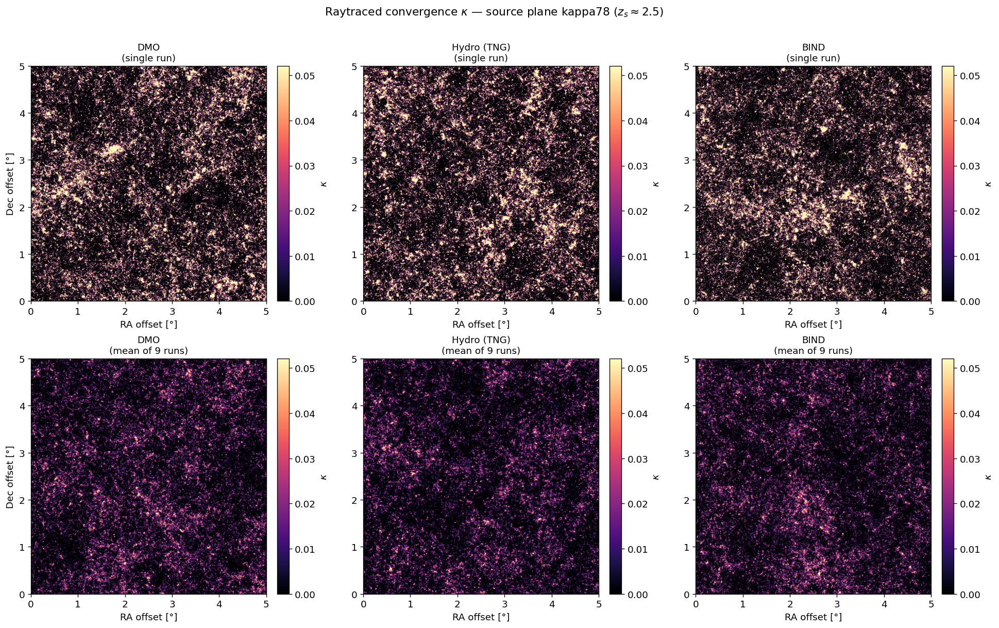

Dataset              N    single-run σ    mean-map σ
  DMO                9         0.05019       0.01685
  Hydro (TNG)        9         0.04834       0.01606
  BIND               9         0.05129       0.01719


In [29]:
# ── Map visualization: one example + mean map for each dataset ────────────────
labels_ordered = [l for l in ["DMO", "Hydro (TNG)", "BIND"] if l in datasets]
ncols = len(labels_ordered)

if ncols == 0:
    print("No datasets loaded yet.")
else:
    fig, axes = plt.subplots(2, ncols, figsize=(5.5 * ncols, 10))
    if ncols == 1:
        axes = axes[:, np.newaxis]

    # Global colour scale from the hydro or DMO mean map
    ref_arr = datasets.get("Hydro (TNG)", datasets.get("DMO", list(datasets.values())[0]))
    mean_ref = ref_arr.mean(axis=0)
    vmax_kap = np.percentile(mean_ref, 99.5)
    vmin_kap = 0.0

    ext = [0, 5, 0, 5]   # 5° × 5° in degrees

    for col, lbl in enumerate(labels_ordered):
        arr  = datasets[lbl]   # (N_runs, N, N)
        mean = arr.mean(axis=0)
        ex1  = arr[0]          # single realisation

        for row, (kmap, title) in enumerate([(ex1, f"{lbl}\n(single run)"),
                                              (mean, f"{lbl}\n(mean of {arr.shape[0]} runs)")]):
            ax = axes[row, col]
            im = ax.imshow(kmap, cmap="magma", origin="lower", vmin=vmin_kap, vmax=vmax_kap,
                           extent=ext)
            ax.set_title(title, fontsize=11)
            ax.set_xlabel("RA offset [°]")
            if col == 0:
                ax.set_ylabel("Dec offset [°]")
            plt.colorbar(im, ax=ax, label=r"$\kappa$", fraction=0.046, pad=0.04)

    plt.suptitle(rf"Raytraced convergence $\kappa$ — source plane {SOURCE_PLANE}"
                 r" ($z_s \approx 2.5$)", fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

    # Print basic statistics
    print(f"{'Dataset':<15}  {'N':>5}  {'single-run σ':>14}  {'mean-map σ':>12}")
    for lbl in labels_ordered:
        arr = datasets[lbl]
        print(f"  {lbl:<13}  {arr.shape[0]:5d}  "
              f"{arr[0].std():14.5f}  {arr.mean(axis=0).std():12.5f}")

In [ ]:
import Pk_library as PKL

# ── Angular power spectrum Cℓ — per-run mean ± 1σ/√N ─────────────────────────
def kappa_power_spectrum(kmap, pix_rad, threads=4):
    """Flat-sky Cℓ via Pylians Pk_plane.  Returns (ell_centres, Cℓ [rad²]).

    BoxSize = N * pix_rad radians; Pylians k values equal ℓ multipoles directly
    (k [rad⁻¹] = ℓ in the flat-sky limit).  Properly normalised: C_ℓ = σ²·pix²
    for white noise.  MAS='None' since kappa maps are not particle-projected.
    Pylians uses linearly-spaced k bins so the returned ell array is denser
    (~N/2 bins) than the old 35-bin log grid, giving finer ℓ resolution.
    """
    N = kmap.shape[0]
    BoxSize = float(N * pix_rad)   # total angular width in radians
    field = (kmap - kmap.mean()).astype(np.float32)
    pk = PKL.Pk_plane(field, BoxSize, MAS='None', threads=threads, verbose=False)
    return pk.k, pk.Pk

# Pre-compute per-run Cl for all datasets
ps_data = {}
for lbl, arr in datasets.items():
    cls = [kappa_power_spectrum(m, PIX_RAD_LUX)[1] for m in arr]
    ell_c, _ = kappa_power_spectrum(arr[0], PIX_RAD_LUX)
    cls = np.stack(cls)   # (N_runs, N_bins)
    ps_data[lbl] = {
        "ell":  ell_c,
        "mean": cls.mean(axis=0),
        "std":  cls.std(axis=0),
        "N":    len(arr),
    }

# ── Plot: Cℓ and ratio ────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
for lbl in labels_ordered:
    pd   = ps_data[lbl]
    ell  = pd["ell"]
    fac  = ell * (ell + 1) / (2 * np.pi)
    mean = fac * pd["mean"]
    err  = fac * pd["std"] / np.sqrt(pd["N"])
    color = DATASET_COLORS[lbl]
    ax.fill_between(ell, mean - err, mean + err, alpha=0.3, color=color)
    ax.loglog(ell, mean, color=color, lw=2, label=f"{lbl} (N={pd['N']})")

ax.set_xlabel(r"Multipole $\ell$")
ax.set_ylabel(r"$\ell(\ell+1)\,C_\ell^{\kappa\kappa}\,/\,2\pi$")
ax.set_title(rf"Convergence power spectrum — $z_s$ plane {SOURCE_PLANE}")
ax.legend(fontsize=10)
ax.grid(True, which="both", alpha=0.3)

# Ratio panels (both Hydro/DMO and BIND/DMO)
ax = axes[1]
ref_key = "DMO"
if ref_key in ps_data:
    ell_ref = ps_data[ref_key]["ell"]
    cl_ref  = ps_data[ref_key]["mean"]
    for lbl in labels_ordered:
        if lbl == ref_key:
            continue
        pd     = ps_data[lbl]
        # interpolate to common ell grid
        cl_num = np.interp(ell_ref, pd["ell"], pd["mean"])
        ratio  = cl_num / np.where(cl_ref > 0, cl_ref, np.nan)
        ax.semilogx(ell_ref, ratio, color=DATASET_COLORS[lbl], lw=2, label=lbl)
    ax.axhline(1, ls="--", color="k", alpha=0.5, label="DMO (ref)")
    ax.set_xlabel(r"Multipole $\ell$")
    ax.set_ylabel(r"$C_\ell^{\rm X}\,/\,C_\ell^{\rm DMO}$")
    ax.set_title("Baryonic suppression/enhancement of κ power")
    ax.legend(fontsize=10)
    ax.grid(True, which="both", alpha=0.3)
    ax.set_ylim(0.7, 1.3)
else:
    ax.text(0.5, 0.5, "Need DMO runs as reference", ha="center", va="center",
            transform=ax.transAxes, fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()

  DMO: avg peaks = 9958  avg minima = 10190
  Hydro (TNG): avg peaks = 9739  avg minima = 9965
  BIND: avg peaks = 10119  avg minima = 10273


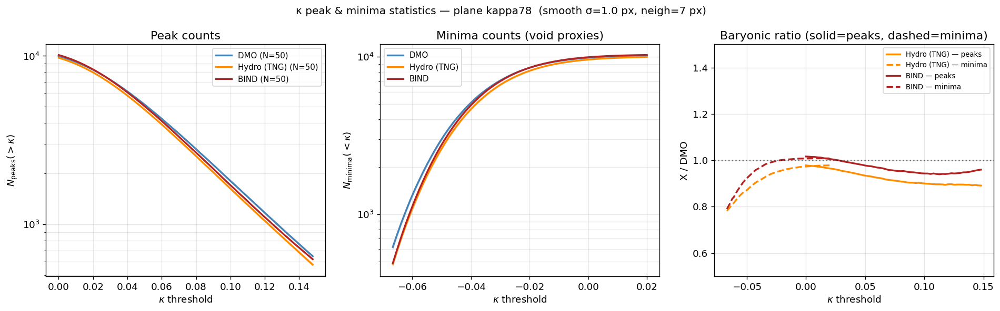

In [25]:
# ── Peak and minima counts — per-run statistics ───────────────────────────────
SMOOTH_SIGMA = 1.   # pixels (~0.44 arcmin)
NEIGHBORHOOD = 7     # local max/min window in pixels

def kappa_peaks(kmap, sigma=SMOOTH_SIGMA, neigh=NEIGHBORHOOD):
    ks = gaussian_filter(kmap.astype(np.float64), sigma=sigma)
    return ks[(ks == maximum_filter(ks, size=neigh))]

def kappa_minima(kmap, sigma=SMOOTH_SIGMA, neigh=NEIGHBORHOOD):
    ks = gaussian_filter(kmap.astype(np.float64), sigma=sigma)
    return ks[(ks == minimum_filter(ks, size=neigh))]

# Compute per-run peak / minima distributions, then take mean ± std
peak_stats   = {}   # label → {"thresholds", "mean_N", "std_N"}
minima_stats = {}

# Threshold grids — set after loading; we build them from a reference run
ref_lbl = next(iter(datasets))
ref_sm  = gaussian_filter(datasets[ref_lbl][0].astype(np.float64), SMOOTH_SIGMA)
klo, khi = np.percentile(ref_sm, 0.5), np.percentile(ref_sm, 99.5)

peak_thr  = np.linspace(max(klo, 0),    khi,            60)
void_thr  = np.linspace(klo,            min(khi, 0.02), 60)

for lbl, arr in datasets.items():
    run_peak_Ns   = []
    run_void_Ns   = []
    for kmap in arr:
        pk = kappa_peaks(kmap)
        mn = kappa_minima(kmap)
        run_peak_Ns.append(np.array([(pk > t).sum() for t in peak_thr]))
        run_void_Ns.append(np.array([(mn < t).sum() for t in void_thr]))
    run_peak_Ns = np.stack(run_peak_Ns).astype(float)
    run_void_Ns = np.stack(run_void_Ns).astype(float)
    N = len(arr)
    peak_stats[lbl]   = {"thr": peak_thr, "mean": run_peak_Ns.mean(0),
                          "std": run_peak_Ns.std(0),  "N": N}
    minima_stats[lbl] = {"thr": void_thr, "mean": run_void_Ns.mean(0),
                          "std": run_void_Ns.std(0),  "N": N}
    print(f"  {lbl}: avg peaks = {run_peak_Ns.mean(0)[0]:.0f}  "
          f"avg minima = {run_void_Ns.mean(0)[-1]:.0f}")

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Panel 1: N(>κ) peaks
ax = axes[0]
for lbl in labels_ordered:
    st = peak_stats[lbl]
    c  = DATASET_COLORS[lbl]
    err = st["std"] / np.sqrt(st["N"])
    ax.fill_between(st["thr"], st["mean"] - err, st["mean"] + err,
                    alpha=0.25, color=c)
    ax.semilogy(st["thr"], np.maximum(st["mean"], 0.5),
                color=c, lw=2, label=f"{lbl} (N={st['N']})")
ax.set_xlabel(r"$\kappa$ threshold")
ax.set_ylabel(r"$N_{\rm peaks}(>\kappa)$")
ax.set_title("Peak counts")
ax.legend(fontsize=9)
ax.grid(True, which="both", alpha=0.3)

# Panel 2: N(<κ) minima (void proxies)
ax = axes[1]
for lbl in labels_ordered:
    st = minima_stats[lbl]
    c  = DATASET_COLORS[lbl]
    err = st["std"] / np.sqrt(st["N"])
    ax.fill_between(st["thr"], np.maximum(st["mean"] - err, 0.5),
                    st["mean"] + err, alpha=0.25, color=c)
    ax.semilogy(st["thr"], np.maximum(st["mean"], 0.5),
                color=c, lw=2, label=f"{lbl}")
ax.set_xlabel(r"$\kappa$ threshold")
ax.set_ylabel(r"$N_{\rm minima}(<\kappa)$")
ax.set_title("Minima counts (void proxies)")
ax.legend(fontsize=9)
ax.grid(True, which="both", alpha=0.3)

# Panel 3: ratio X / DMO for peaks + minima
ax = axes[2]
if "DMO" in peak_stats:
    ref_pk = peak_stats["DMO"]["mean"]
    ref_mn = minima_stats["DMO"]["mean"]
    for lbl in labels_ordered:
        if lbl == "DMO":
            continue
        c = DATASET_COLORS[lbl]
        # peaks
        ratio_pk = np.where(ref_pk > 5, peak_stats[lbl]["mean"] / ref_pk, np.nan)
        ax.plot(peak_thr, ratio_pk, color=c, lw=2, label=f"{lbl} — peaks")
        # minima
        ratio_mn = np.where(ref_mn > 5, minima_stats[lbl]["mean"] / ref_mn, np.nan)
        ax.plot(void_thr, ratio_mn, color=c, lw=2, ls="--",
                label=f"{lbl} — minima")
    ax.axhline(1, ls=":", color="k", alpha=0.5)
    ax.set_xlabel(r"$\kappa$ threshold")
    ax.set_ylabel("X / DMO")
    ax.set_title("Baryonic ratio (solid=peaks, dashed=minima)")
    ax.legend(fontsize=8, ncol=1)
    ax.grid(True, alpha=0.3)
    ax.set_ylim(0.5, 1.5)
else:
    ax.text(0.5, 0.5, "Need DMO as reference", ha="center", va="center",
            transform=ax.transAxes, fontsize=12)
    ax.axis("off")

plt.suptitle(rf"κ peak & minima statistics — plane {SOURCE_PLANE}  "
             rf"(smooth σ={SMOOTH_SIGMA} px, neigh={NEIGHBORHOOD} px)", fontsize=12)
plt.tight_layout()
plt.show()

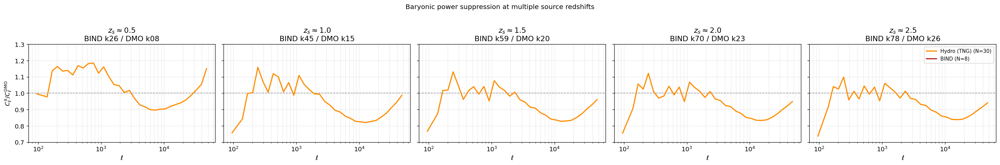

In [33]:
# ── Multi-source-plane power spectrum ratio ────────────────────────────────────
# Compare at 5 source redshifts (z~0.5, 1.0, 1.5, 2.0, 2.5).
# Plane indices are chi-matched per dataset via PLANE_MAP (set in the setup cell).

nested_map = {"DMO": False, "Hydro (TNG)": True, "BIND": False}
rt_dir_map = {"DMO": DMO_RT_DIR, "Hydro (TNG)": HYDRO_RT_DIR, "BIND": BIND_RT_DIR}
ref_key    = "DMO"

n_panels = len(Z_LABELS)
fig, axes = plt.subplots(1, n_panels, figsize=(5 * n_panels, 4), sharey=True)

for col, z_label in enumerate(Z_LABELS):
    ax = axes[col]
    ax.axhline(1, ls="--", color="k", alpha=0.4, lw=1)

    plane_sets = {}
    for lbl in ["DMO", "Hydro (TNG)", "BIND"]:
        pl = PLANE_MAP[lbl][col]
        maps = load_dataset_maps(rt_dir_map[lbl], pl,
                                 nested_lp=nested_map[lbl], max_runs=30)
        if maps:
            plane_sets[lbl] = {"arr": np.stack(maps), "plane": pl}

    if ref_key not in plane_sets:
        ax.set_title(f"z~{z_label}\n(no DMO)")
        continue

    ell_ref, cl_ref_mean = None, None
    for lbl in [ref_key] + [l for l in ["DMO", "Hydro (TNG)", "BIND"] if l != ref_key]:
        if lbl not in plane_sets:
            continue
        arr     = plane_sets[lbl]["arr"]
        cls     = np.stack([kappa_power_spectrum(m, PIX_RAD_LUX)[1] for m in arr])
        ell, _  = kappa_power_spectrum(arr[0], PIX_RAD_LUX)
        cl_mean = cls.mean(0)
        if lbl == ref_key:
            ell_ref, cl_ref_mean = ell, cl_mean
        else:
            cl_num = np.interp(ell_ref, ell, cl_mean)
            ratio  = cl_num / np.where(cl_ref_mean > 0, cl_ref_mean, np.nan)
            n_runs = arr.shape[0]
            ax.semilogx(ell_ref, ratio, color=DATASET_COLORS[lbl], lw=2,
                        label=f"{lbl} (N={n_runs})")

    bind_pl = PLANE_MAP["BIND"][col]
    dmo_pl  = PLANE_MAP["DMO"][col]
    ax.set_xlabel(r"$\ell$")
    if col == 0:
        ax.set_ylabel(r"$C_\ell^{\rm X} / C_\ell^{\rm DMO}$")
    ax.set_title(f"$z_s\\approx{z_label}$\nBIND k{bind_pl:02d} / DMO k{dmo_pl:02d}")
    ax.set_ylim(0.7, 1.3)
    ax.grid(True, which="both", alpha=0.25)
    if col == n_panels - 1:
        ax.legend(fontsize=9)

plt.suptitle("Baryonic power suppression at multiple source redshifts", fontsize=12, y=1.02)
plt.tight_layout()
plt.show()

In [31]:
test = np.load('/mnt/home/mlee1/ceph/bind_lightcone_tng/snap_096/stage1/stage1_slab00.npz')
test_bind = np.load('/mnt/home/mlee1/ceph/bind_lightcone_tng/snap_096/composite_slab00.npz')

In [35]:
test_bind.files

['dmo',
 'composite',
 'alpha',
 'patch_scales',
 'scale_global',
 'coverage_pct',
 'n_halos',
 'slab_idx',
 'n_slabs',
 'box_size',
 'halo_centers',
 'halo_masses',
 'halo_r200',
 'generated_patches',
 'thermo_patches',
 'condition_sums']

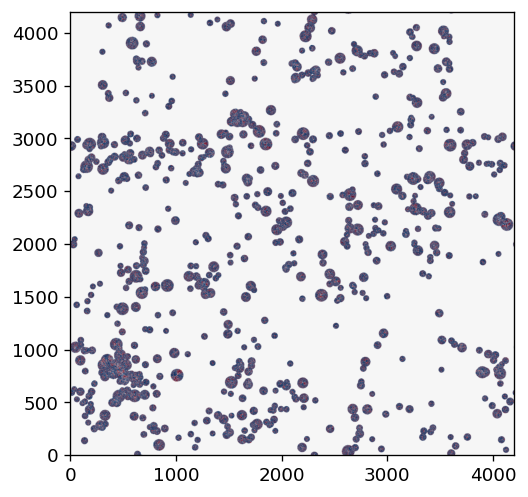

In [40]:
plt.imshow(test['dmo']/test_bind['composite'].sum(axis=0) - 1, cmap='RdBu_r', origin='lower', vmin=-.1, vmax=.1)

## Projection MAS validation — BIND vs truth (no raytracing)

Decisive check that the convergence-power "upturn" is a **raw-CIC aliasing
artifact in the lightcone projection**, common to DMO and BIND, *not* the
generative model. Uses `examples/lightcone_projection_check.py`.

- **BIND/DMO** (same pipeline) vs **hydro/DMO** (truth): if they overlap, BIND
  reproduces the true baryonic suppression (the science is fine — ratio against
  the *same-pipeline* DMO so the artifact cancels).
- **DMO_lc/DMO_truth**: the pipeline projection mismatch. `k_safe` is where it
  starts to dominate. To remove it, re-run stage 1 with `--mas_correct`
  (interlacing + CIC deconvolution → `dmo_aa`, used as the composite background).

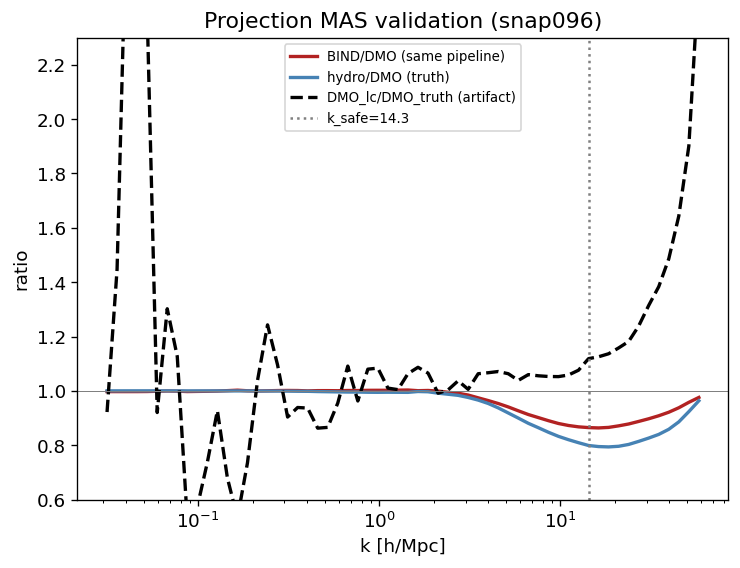

k_safe (DMO_lc vs DMO_truth within 10%) = 14.34 h/Mpc
BIND reproduces the truth suppression below k_safe; the high-k excess is a common-mode CIC aliasing artifact (fix: stage 1 --mas_correct).


In [48]:
import sys; sys.path.insert(0, 'examples'); sys.path.insert(0, '.')
import matplotlib.pyplot as plt
from lightcone_projection_check import compare_projection

LC = "/mnt/home/mlee1/ceph/bind_lightcone_tng/snap_096"
PR = "/mnt/home/mlee1/ceph/hydro_replace_fields/L205n2500TNG/snap096/projected"

fig, ax = plt.subplots(figsize=(7, 5))
res = compare_projection(LC, f"{PR}/hydro.npz", f"{PR}/dmo.npz", ax=ax)
ax.set_title("Projection MAS validation (snap096)")
plt.show()
print(f"k_safe (DMO_lc vs DMO_truth within 10%) = {res['k_safe']:.2f} h/Mpc")
print("BIND reproduces the truth suppression below k_safe; the high-k excess is "
      "a common-mode CIC aliasing artifact (fix: stage 1 --mas_correct).")